1,prepare data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers.core import Dense, Dropout, Activation
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import pandas as pd
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
import numpy
import time


Using TensorFlow backend.


In [2]:
Open=pd.read_csv('SP500_new.csv', usecols=[1],engine='python', skipfooter=1).values.astype('float32')
High=pd.read_csv('SP500_new.csv', usecols=[2],engine='python', skipfooter=1).values.astype('float32')
Low=pd.read_csv('SP500_new.csv', usecols=[3],engine='python', skipfooter=1).values.astype('float32')
Close=pd.read_csv('SP500_new.csv', usecols=[4],engine='python', skipfooter=1).values.astype('float32')
Adjclose=pd.read_csv('SP500_new.csv', usecols=[5],engine='python', skipfooter=1).values.astype('float32')
Vloume=pd.read_csv('SP500_new.csv', usecols=[6],engine='python', skipfooter=1).values.astype('float32')

In [3]:
def preparedata(features):
    
    lenth=len(pd.read_csv('SP500_new.csv', usecols=[1],engine='python', skipfooter=1).values.astype('float32'))
    
    dataX = []
    for i in range(lenth):
        a=[]
        for feature in features:
            a.append(feature[i, 0])
        dataX.append(a)
    dataset=numpy.array(dataX)

    dataY = []
    for i in range(1,lenth):
        a=[]
        a.append(Adjclose[i, 0])
        dataY.append(a)
    target=numpy.array(dataY)

    dataset=dataset[:-1]

    # normalize the dataset
    scaler_dataset = MinMaxScaler(feature_range=(0, 1))
    dataset = scaler_dataset.fit_transform(dataset)

    # normalize the dataset
    scaler_target = MinMaxScaler(feature_range=(0, 1))
    target = scaler_target.fit_transform(target)

    trainX=dataset[:-500]
    testX=dataset[-500:]
    trainY=target[:-500]
    testY=target[-500:]

    # reshape input to be [samples, time steps, features]
    trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
    testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
    return trainX,trainY,testX,testY,scaler_dataset,scaler_target


4.4,tune architecture: neuron and layers 1 layer with different neurons 2 layer with different neurons 3 layer with different neurons"

In [10]:
repeats=5
neurons=[2,3,4,5,7,10,15,20,25,30,40,50,70,100]
dropout=0

accuracy plot


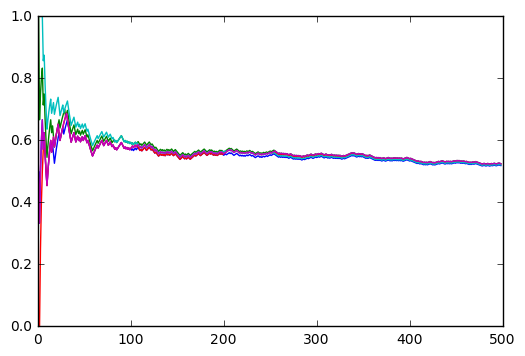

adjclose plot


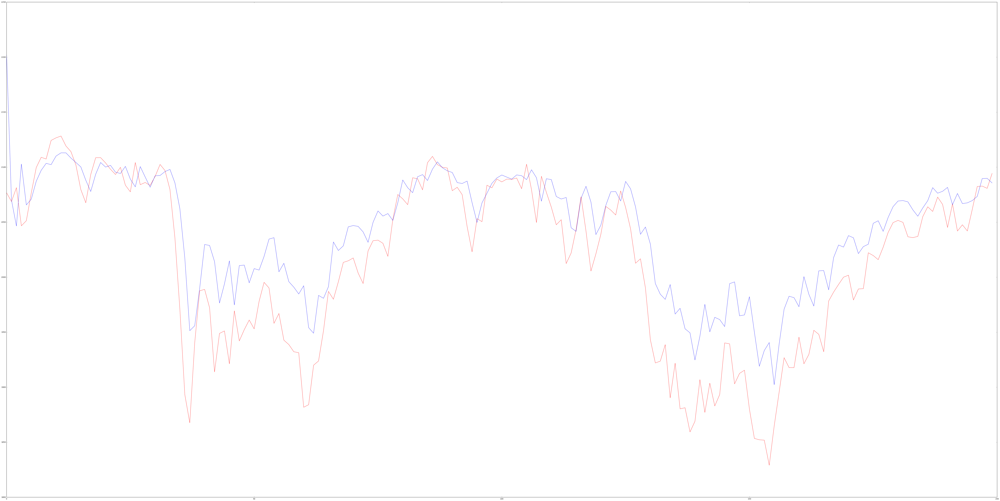

mean of test_RMSE
84.5036861487
std of test_RMSE
18.490476749
mean of test_r2Score
0.661904611598
std of test_r2Score
0.162824548298
mean of accuracy_all
0.560495740205
std of accuracy_all
0.0089640764208
mean of accuracy_30
0.677419354839
std of accuracy_30
0.0204017913559
accuracy plot


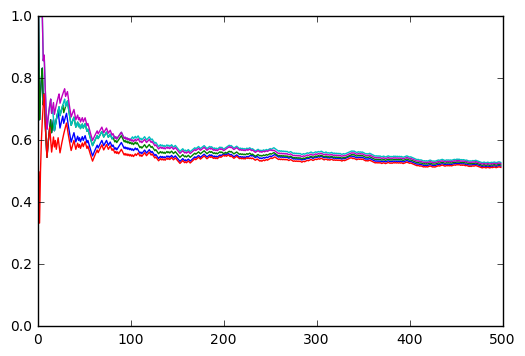

adjclose plot


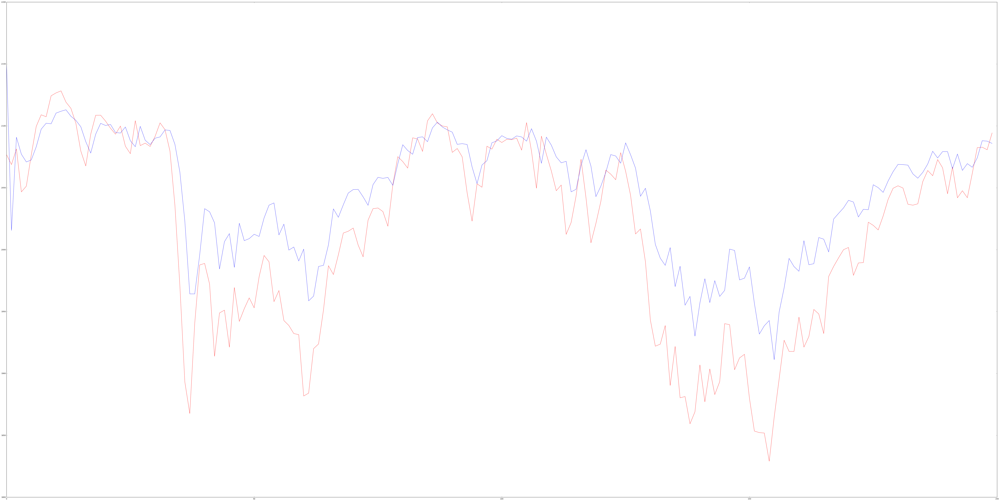

mean of test_RMSE
84.7796214173
std of test_RMSE
16.7309322253
mean of test_r2Score
0.662594199145
std of test_r2Score
0.134829695366
mean of accuracy_all
0.566004089621
std of accuracy_all
0.0155657711334
mean of accuracy_30
0.696774193548
std of accuracy_30
0.0328969000877
accuracy plot


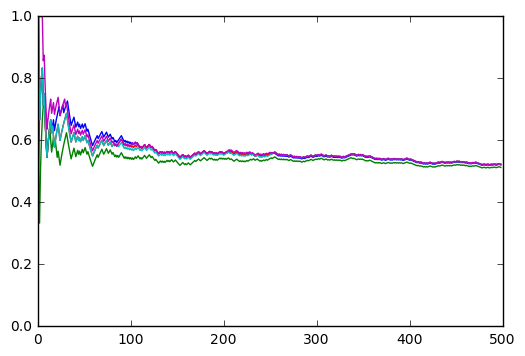

adjclose plot


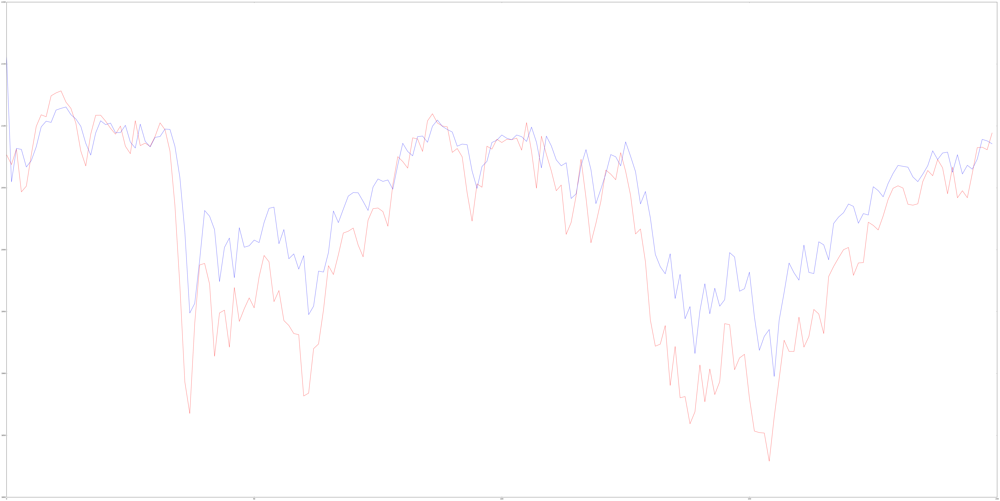

mean of test_RMSE
76.4574187999
std of test_RMSE
8.32194746898
mean of test_r2Score
0.732741865624
std of test_r2Score
0.0598864365187
mean of accuracy_all
0.559583355579
std of accuracy_all
0.0112799353619
mean of accuracy_30
0.677419354839
std of accuracy_30
0.0353369391939
accuracy plot


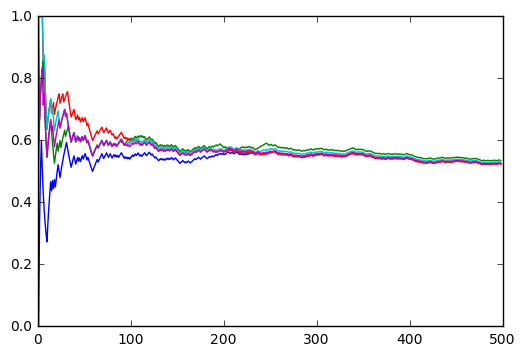

adjclose plot


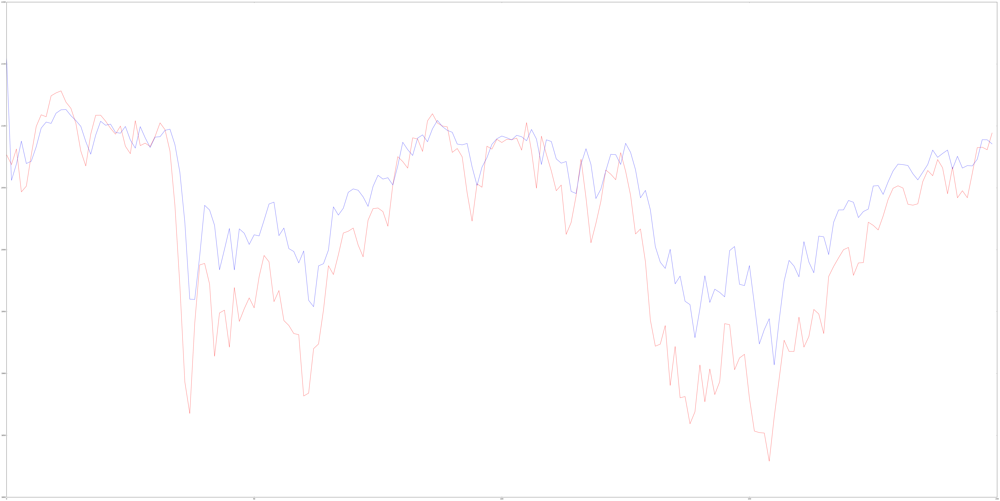

mean of test_RMSE
66.7438041865
std of test_RMSE
15.8780802
mean of test_r2Score
0.787329585087
std of test_r2Score
0.0969332363266
mean of accuracy_all
0.566422770565
std of accuracy_all
0.014811862858
mean of accuracy_30
0.658064516129
std of accuracy_30
0.056243857336
accuracy plot


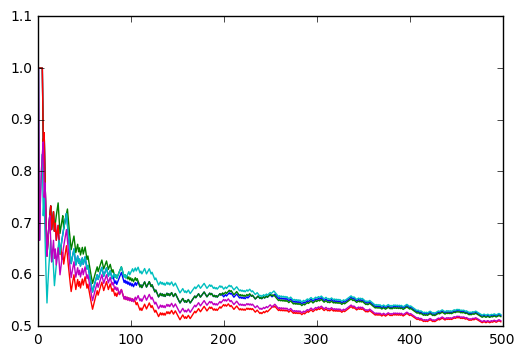

adjclose plot


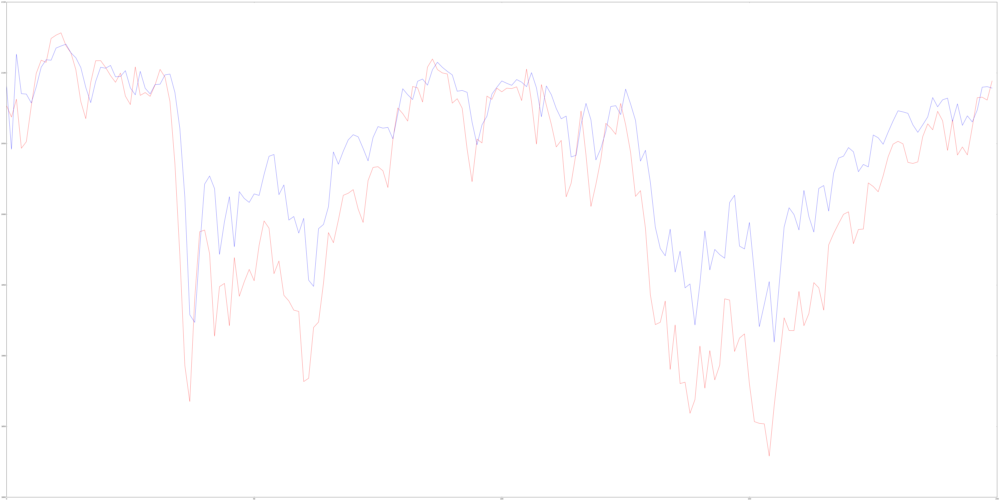

mean of test_RMSE
70.8108195692
std of test_RMSE
10.279658877
mean of test_r2Score
0.768669182103
std of test_r2Score
0.0612228514509
mean of accuracy_all
0.5619124658
std of accuracy_all
0.011084847918
mean of accuracy_30
0.690322580645
std of accuracy_30
0.0258064516129
accuracy plot


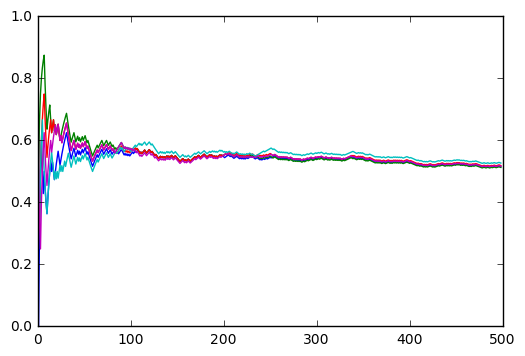

adjclose plot


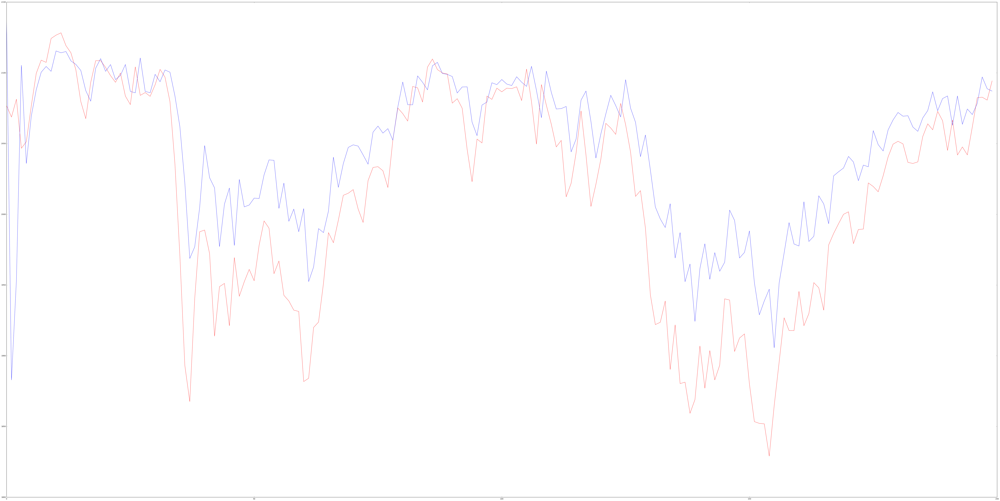

mean of test_RMSE
60.8067239463
std of test_RMSE
7.96882283454
mean of test_r2Score
0.830067867947
std of test_r2Score
0.0438433507264
mean of accuracy_all
0.546968364086
std of accuracy_all
0.005708372839
mean of accuracy_30
0.61935483871
std of accuracy_30
0.0554988726906
accuracy plot


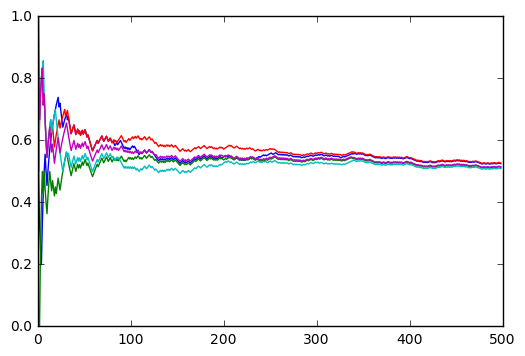

adjclose plot


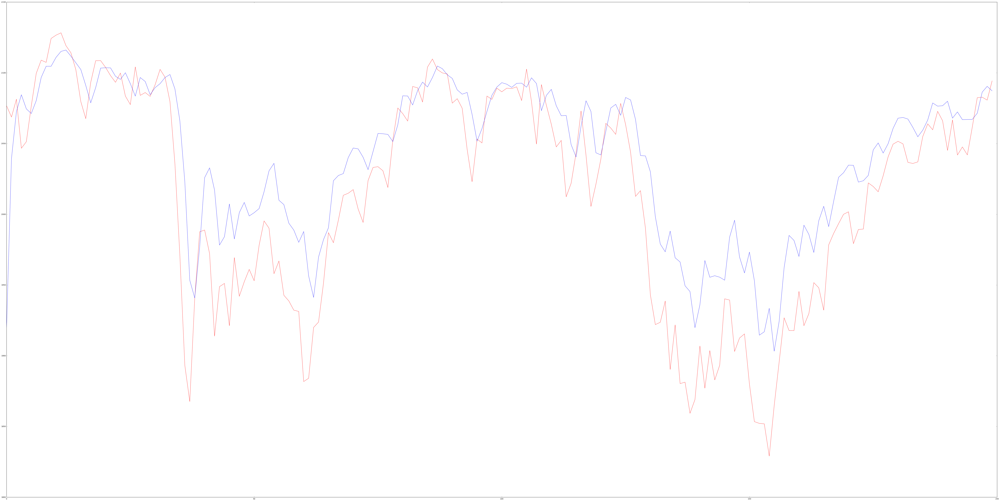

mean of test_RMSE
71.4979990741
std of test_RMSE
11.2592169481
mean of test_r2Score
0.763297328816
std of test_r2Score
0.0798632477359
mean of accuracy_all
0.545623173832
std of accuracy_all
0.0185467775706
mean of accuracy_30
0.61935483871
std of accuracy_30
0.0591300089672
accuracy plot


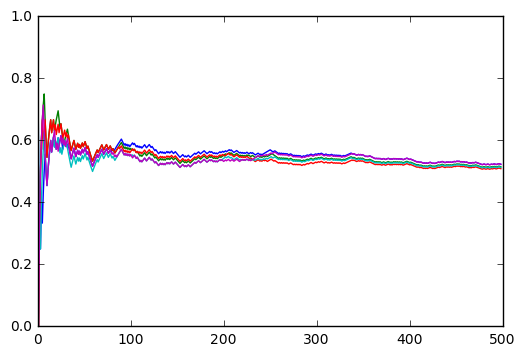

adjclose plot


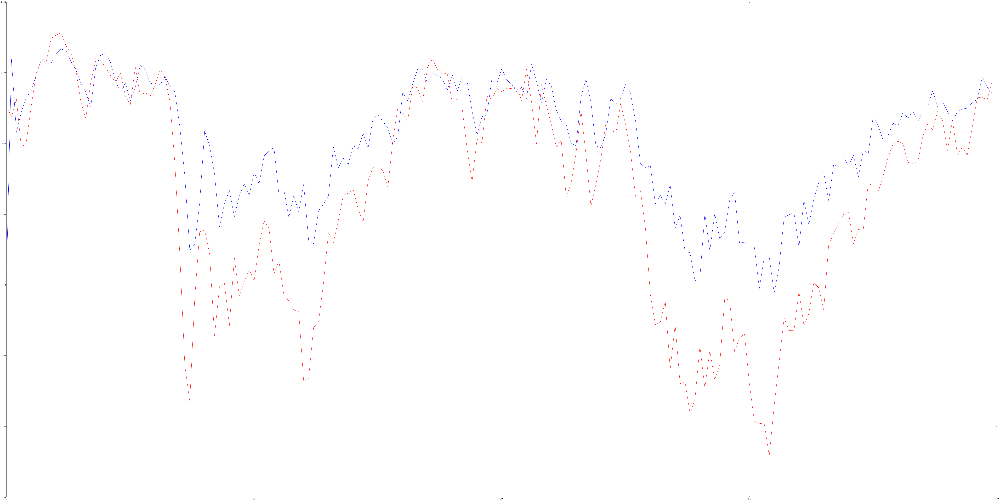

mean of test_RMSE
75.219348323
std of test_RMSE
11.3426234452
mean of test_r2Score
0.738542750682
std of test_r2Score
0.0778321566849
mean of accuracy_all
0.542433728393
std of accuracy_all
0.00603406640518
mean of accuracy_30
0.593548387097
std of accuracy_30
0.0158031596309
accuracy plot


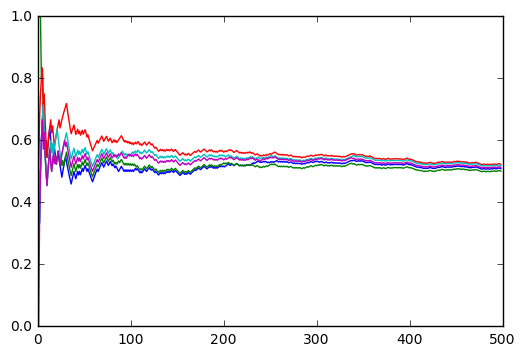

adjclose plot


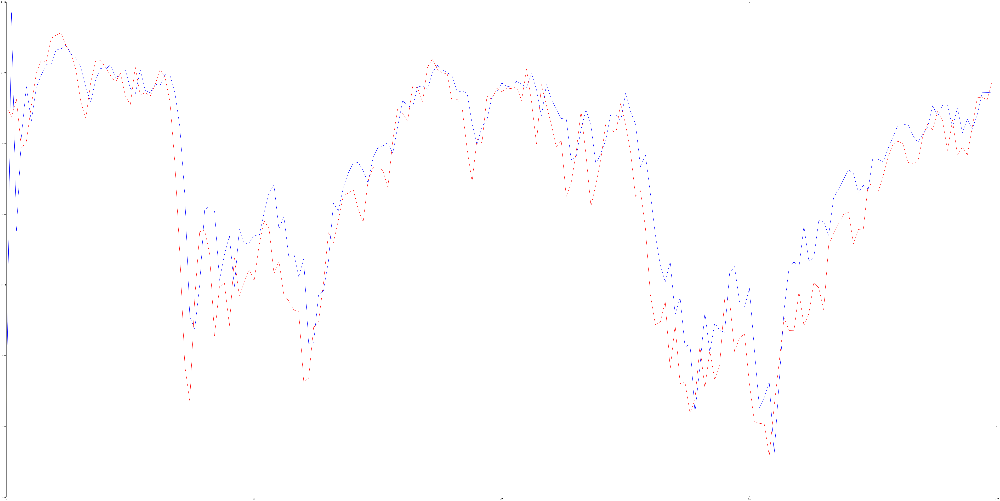

mean of test_RMSE
71.6484395175
std of test_RMSE
13.6414014478
mean of test_r2Score
0.759644146498
std of test_r2Score
0.0913120579707
mean of accuracy_all
0.535175831675
std of accuracy_all
0.0171852879506
mean of accuracy_30
0.6
std of accuracy_30
0.0598297967451
accuracy plot


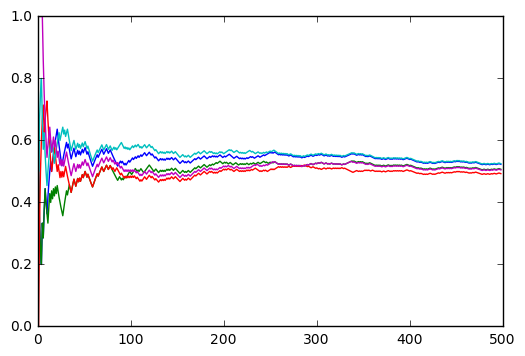

adjclose plot


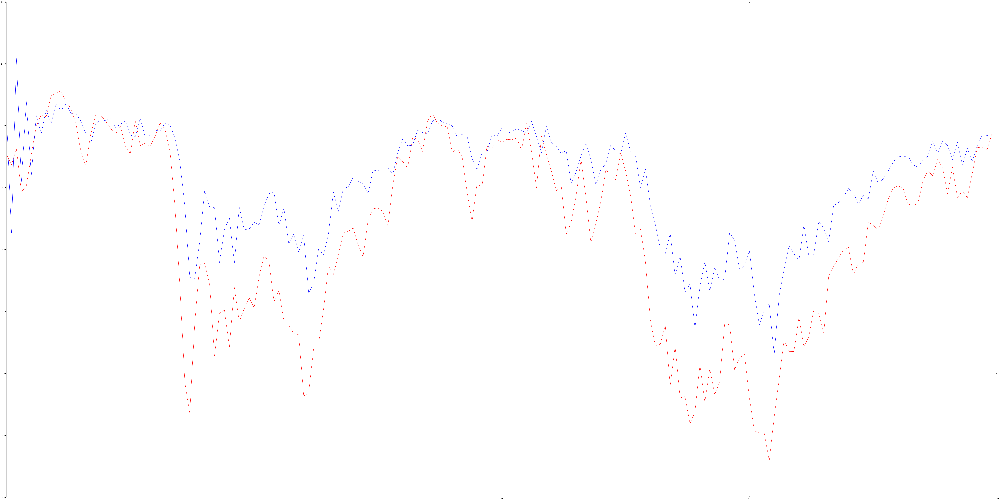

mean of test_RMSE
73.8625090543
std of test_RMSE
30.8409968273
mean of test_r2Score
0.710518692094
std of test_r2Score
0.243080848593
mean of accuracy_all
0.524780939187
std of accuracy_all
0.0223430782529
mean of accuracy_30
0.535483870968
std of accuracy_30
0.0664234202644
accuracy plot


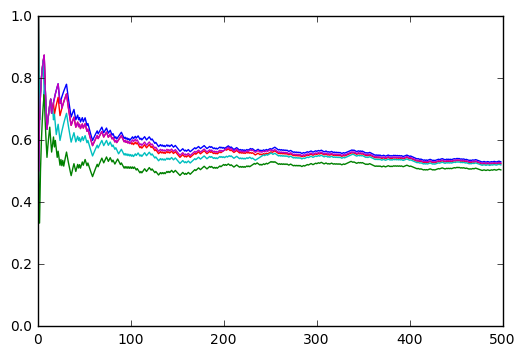

adjclose plot


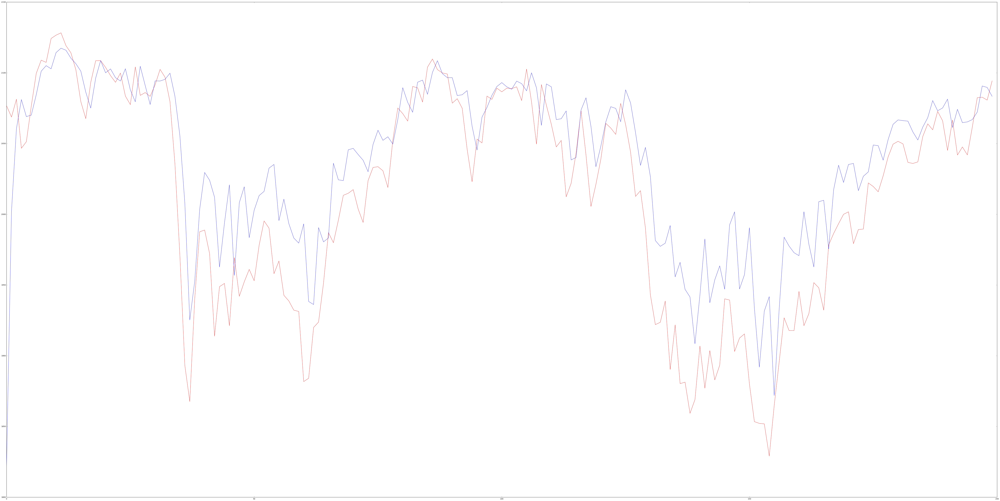

mean of test_RMSE
85.3390047808
std of test_RMSE
17.7490252081
mean of test_r2Score
0.656708411683
std of test_r2Score
0.136300706308
mean of accuracy_all
0.561938953749
std of accuracy_all
0.0228075486612
mean of accuracy_30
0.696774193548
std of accuracy_30
0.0805806193342
accuracy plot


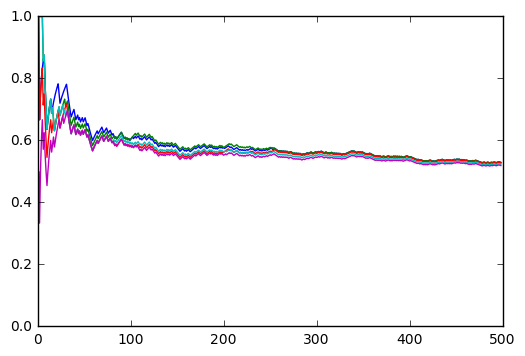

adjclose plot


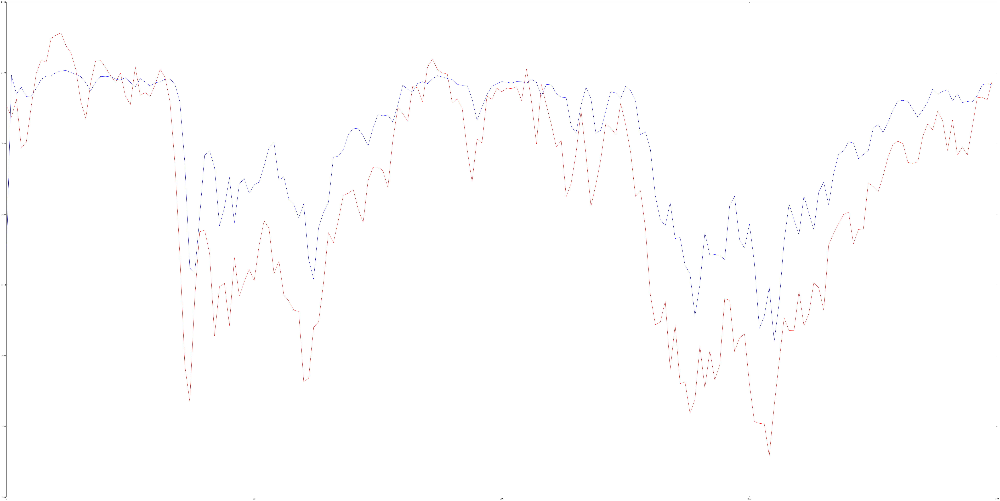

mean of test_RMSE
104.420052797
std of test_RMSE
15.7562901499
mean of test_r2Score
0.496125832776
std of test_r2Score
0.149287992226
mean of accuracy_all
0.572921127135
std of accuracy_all
0.0114919219668
mean of accuracy_30
0.709677419355
std of accuracy_30
0.0353369391939
accuracy plot


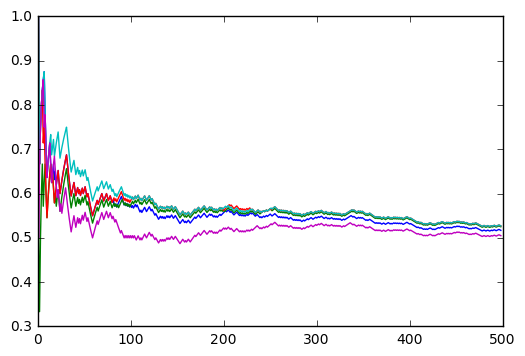

adjclose plot


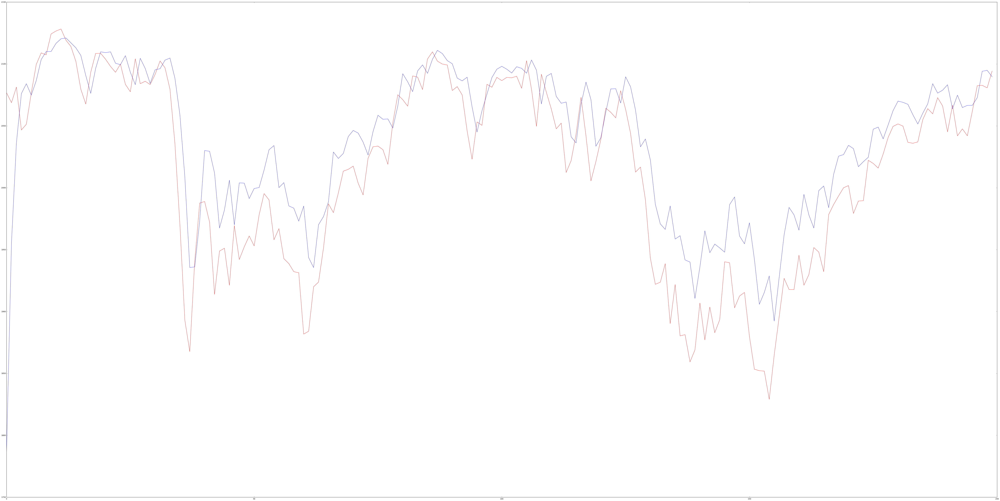

mean of test_RMSE
96.6364632795
std of test_RMSE
3.31102856264
mean of test_r2Score
0.577556718172
std of test_r2Score
0.0290641215961
mean of accuracy_all
0.557233622082
std of accuracy_all
0.0167253583085
mean of accuracy_30
0.670967741935
std of accuracy_30
0.0427951585852
accuracy plot


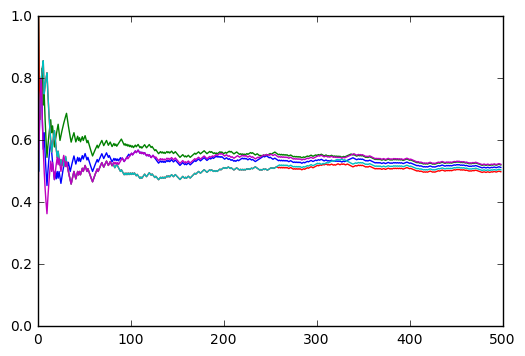

adjclose plot


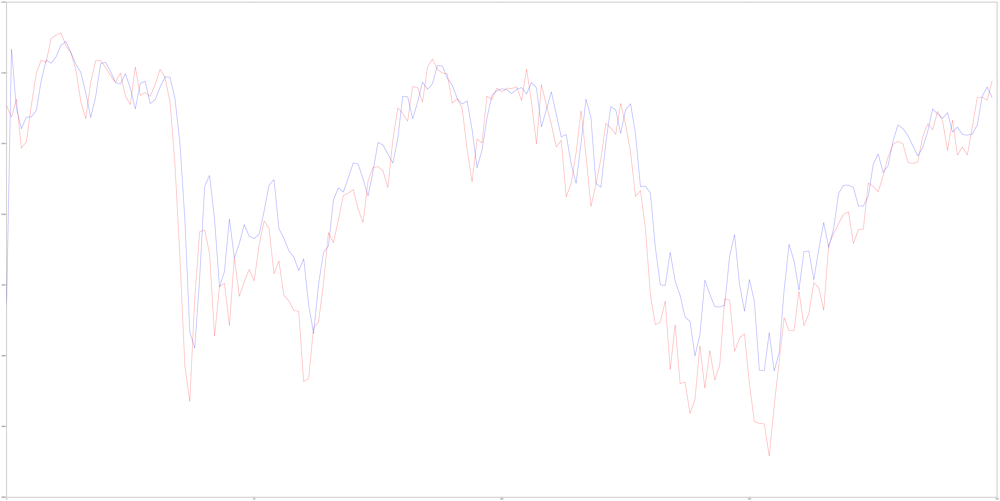

mean of test_RMSE
71.3282024945
std of test_RMSE
19.8536609008
mean of test_r2Score
0.752311206371
std of test_r2Score
0.122109315521
mean of accuracy_all
0.532517829235
std of accuracy_all
0.0171736008263
mean of accuracy_30
0.561290322581
std of accuracy_30
0.0598297967451


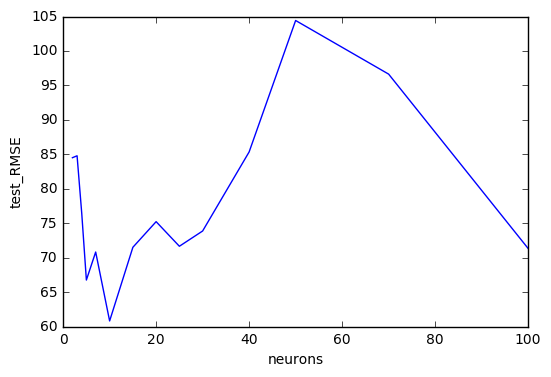

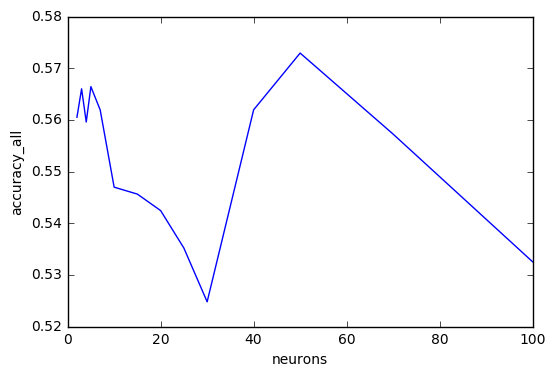

time cost
55796.54237961769


In [11]:
start = time.time()

test_RMSE_all=[]
accuracy_all_all=[]

for neuron in neurons:
    test_RMSE=[]
    test_r2Score=[]
    accuracy_all=[]
    accuracy_30=[]
    for i in range(repeats):
        trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata([Open,High,Low,Close])
        # create and fit the LSTM network
        model = Sequential()
        model.add(LSTM(neuron, batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True))
        #model.add(Dropout(dropout))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        for i in range(100):
            model.fit(trainX, trainY, epochs=1, batch_size=1, verbose=0, shuffle=False)
            model.reset_states()

        # make predictions
        testPredict = model.predict(testX, batch_size=1)
        # invert predictions
        testPredict =  scaler_target.inverse_transform(testPredict)
        testY =  scaler_target.inverse_transform(testY)
        # calculate root mean squared error and R2 score
        test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
        test_r2Score.append(r2_score(testY, testPredict))
        #transfer to classification probelm
        test_true=testY[:]
        test_pred=testPredict[:]

        test_true_clssfi=[]
        for  i in range(1,len(test_true)):
            if test_true[i]>test_true[i-1]:
                test_true_clssfi.append(1)
            else:
                test_true_clssfi.append(0)

        test_pred_clssfi=[]
        for  i in range(1,len(test_pred)):
            if test_pred[i]>test_true[i-1]:
                test_pred_clssfi.append(1)
            else:
                test_pred_clssfi.append(0)

        accuracy=[]
        for i in range(1,len(test_pred_clssfi)+1):
            accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
        plt.plot(accuracy)
        accuracy_all.append(np.mean(accuracy))
        accuracy_30.append(np.mean(accuracy[30]))

    print('accuracy plot')    
    plt.show()

    print('adjclose plot')  
    test_true=testY[:200]
    test_pred=testPredict[:200]

    fig, ax = plt.subplots(figsize=(100, 50))
    plt.plot(test_true,color='red')
    plt.plot(test_pred,color='blue')
    plt.show()

    print('mean of test_RMSE')
    print(np.mean(test_RMSE))

    print('std of test_RMSE')
    print(np.std(test_RMSE))

    print('mean of test_r2Score')
    print(np.mean(test_r2Score))

    print('std of test_r2Score')
    print(np.std(test_r2Score))

    print('mean of accuracy_all')
    print(np.mean(accuracy_all))

    print('std of accuracy_all')
    print(np.std(accuracy_all))

    print('mean of accuracy_30')
    print(np.mean(accuracy_30))

    print('std of accuracy_30')
    print(np.std(accuracy_30))

    test_RMSE_all.append(np.mean(test_RMSE))
    accuracy_all_all.append(np.mean(accuracy_all))
  
    

plt.plot(neurons,test_RMSE_all)
plt.xlabel('neurons')
plt.ylabel('test_RMSE')
plt.show()

plt.plot(neurons,accuracy_all_all)
plt.xlabel('neurons')
plt.ylabel('accuracy_all')
plt.show()


print('time cost')
print( time.time() - start)  

4.4.2 2 layers

In [4]:
repeats=5
neurons=[[2,2],[3,3],[4,4],[5,5],[10,10],[30,30],[50,50],[70,70],[100,100],[2,4],[4,8],[8,16],[16,32],[32,64]]
dropout=0

In [ ]:
start = time.time()

test_RMSE_all=[]
accuracy_all_all=[]

for neuron in neurons:
    
    test_RMSE=[]
    test_r2Score=[]
    accuracy_all=[]
    accuracy_30=[]
    for i in range(repeats):
        trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata([Open,High,Low,Close])
        # create and fit the LSTM network
        model = Sequential()
        model.add(LSTM(neuron[0], batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True, return_sequences=True))
        #model.add(Dropout(dropout))
        model.add(LSTM(neuron[1], batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True, return_sequences=False))
        #model.add(Dropout(dropout))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        for i in range(100):
            model.fit(trainX, trainY, epochs=1, batch_size=1, verbose=0, shuffle=False)
            model.reset_states()

        # make predictions
        testPredict = model.predict(testX, batch_size=1)
        # invert predictions
        testPredict =  scaler_target.inverse_transform(testPredict)
        testY =  scaler_target.inverse_transform(testY)
        # calculate root mean squared error and R2 score
        test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
        test_r2Score.append(r2_score(testY, testPredict))
        #transfer to classification probelm
        test_true=testY[:]
        test_pred=testPredict[:]

        test_true_clssfi=[]
        for  i in range(1,len(test_true)):
            if test_true[i]>test_true[i-1]:
                test_true_clssfi.append(1)
            else:
                test_true_clssfi.append(0)

        test_pred_clssfi=[]
        for  i in range(1,len(test_pred)):
            if test_pred[i]>test_true[i-1]:
                test_pred_clssfi.append(1)
            else:
                test_pred_clssfi.append(0)

        accuracy=[]
        for i in range(1,len(test_pred_clssfi)+1):
            accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
        plt.plot(accuracy)
        accuracy_all.append(np.mean(accuracy))
        accuracy_30.append(np.mean(accuracy[30]))

    print('accuracy plot')    
    plt.show()

    print('adjclose plot')  
    test_true=testY[:200]
    test_pred=testPredict[:200]

    fig, ax = plt.subplots(figsize=(100, 50))
    plt.plot(test_true,color='red')
    plt.plot(test_pred,color='blue')
    plt.show()

    print('mean of test_RMSE')
    print(np.mean(test_RMSE))

    print('std of test_RMSE')
    print(np.std(test_RMSE))

    print('mean of test_r2Score')
    print(np.mean(test_r2Score))

    print('std of test_r2Score')
    print(np.std(test_r2Score))

    print('mean of accuracy_all')
    print(np.mean(accuracy_all))

    print('std of accuracy_all')
    print(np.std(accuracy_all))

    print('mean of accuracy_30')
    print(np.mean(accuracy_30))

    print('std of accuracy_30')
    print(np.std(accuracy_30))

    test_RMSE_all.append(np.mean(test_RMSE))
    accuracy_all_all.append(np.mean(accuracy_all))
  
    

plt.plot(test_RMSE_all)
plt.ylabel('test_RMSE')
plt.show()

plt.plot(accuracy_all_all)
plt.ylabel('accuracy_all')
plt.show()



print('time cost')
print( time.time() - start)  

4.4.3 3 layers

In [5]:
repeats=5
neurons=[[2,2,2],[3,3,3],[4,4,4],[5,5,5],[10,10,10],[30,30,30],[50,50,50],[70,70,70]]
dropout=0

In [7]:
start = time.time()

test_RMSE_all=[]
accuracy_all_all=[]

for neuron in neurons:
    
    test_RMSE=[]
    test_r2Score=[]
    accuracy_all=[]
    accuracy_30=[]
    for i in range(repeats):
        trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata([Open,High,Low,Close])
        # create and fit the LSTM network
        model = Sequential()
        model.add(LSTM(neuron[0], batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True, return_sequences=True))
        #model.add(Dropout(dropout))
        model.add(LSTM(neuron[1], batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True, return_sequences=True))
        #model.add(Dropout(dropout))
        model.add(LSTM(neuron[2], batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True, return_sequences=False))
        #model.add(Dropout(dropout))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        for i in range(100):
            model.fit(trainX, trainY, epochs=1, batch_size=1, verbose=0, shuffle=False)
            model.reset_states()

        # make predictions
        testPredict = model.predict(testX, batch_size=1)
        # invert predictions
        testPredict =  scaler_target.inverse_transform(testPredict)
        testY =  scaler_target.inverse_transform(testY)
        # calculate root mean squared error and R2 score
        test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
        test_r2Score.append(r2_score(testY, testPredict))
        #transfer to classification probelm
        test_true=testY[:]
        test_pred=testPredict[:]

        test_true_clssfi=[]
        for  i in range(1,len(test_true)):
            if test_true[i]>test_true[i-1]:
                test_true_clssfi.append(1)
            else:
                test_true_clssfi.append(0)

        test_pred_clssfi=[]
        for  i in range(1,len(test_pred)):
            if test_pred[i]>test_true[i-1]:
                test_pred_clssfi.append(1)
            else:
                test_pred_clssfi.append(0)

        accuracy=[]
        for i in range(1,len(test_pred_clssfi)+1):
            accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
        plt.plot(accuracy)
        accuracy_all.append(np.mean(accuracy))
        accuracy_30.append(np.mean(accuracy[30]))

    print('accuracy plot')    
    plt.show()

    print('adjclose plot')  
    test_true=testY[:200]
    test_pred=testPredict[:200]

    fig, ax = plt.subplots(figsize=(100, 50))
    plt.plot(test_true,color='red')
    plt.plot(test_pred,color='blue')
    plt.show()

    print('mean of test_RMSE')
    print(np.mean(test_RMSE))

    print('std of test_RMSE')
    print(np.std(test_RMSE))

    print('mean of test_r2Score')
    print(np.mean(test_r2Score))

    print('std of test_r2Score')
    print(np.std(test_r2Score))

    print('mean of accuracy_all')
    print(np.mean(accuracy_all))

    print('std of accuracy_all')
    print(np.std(accuracy_all))

    print('mean of accuracy_30')
    print(np.mean(accuracy_30))

    print('std of accuracy_30')
    print(np.std(accuracy_30))

    test_RMSE_all.append(np.mean(test_RMSE))
    accuracy_all_all.append(np.mean(accuracy_all))
  
    

plt.plot(test_RMSE_all)
plt.ylabel('test_RMSE')
plt.show()

plt.plot(accuracy_all_all)
plt.ylabel('accuracy_all')
plt.show()



print('time cost')
print( time.time() - start)  

KeyboardInterrupt: 